# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


### Загрузка библиотек

In [5]:
!pip install tensorflow

In [6]:
!pip install spacy
!python -m spacy download en_core_web_sm


  Obtaining dependency information for numpy>=1.19.0 from https://files.pythonhosted.org/packages/8b/72/10c1d2d82101c468a28adc35de6c77b308f288cfd0b88e1070f15b98e00c/numpy-2.2.4-cp311-cp311-win_amd64.whl.metadata
  Using cached numpy-2.2.4-cp311-cp311-win_amd64.whl.metadata (60 kB)
Using cached numpy-2.2.4-cp311-cp311-win_amd64.whl (12.9 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\levle\\AppData\\Local\\Temp\\pip-uninstall-xdg7sezb\\numpy\\core\\_multiarray_tests.cp311-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



  Using cached https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.8.0/en_core_web_sm-3.8.0-py3-none-any.whl (12.8 MB)
[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [7]:
!pip install numpy==1.26.4 --force-reinstall


  Obtaining dependency information for numpy==1.26.4 from https://files.pythonhosted.org/packages/3f/6b/5610004206cf7f8e7ad91c5a85a8c71b2f2f8051a0c0c4d5916b76d6cbb2/numpy-1.26.4-cp311-cp311-win_amd64.whl.metadata
  Using cached numpy-1.26.4-cp311-cp311-win_amd64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp311-cp311-win_amd64.whl (15.8 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.4
    Uninstalling numpy-2.2.4:
      Successfully uninstalled numpy-2.2.4


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.


In [8]:
import numpy as np
print(np.__version__)

1.26.4


In [9]:

import pandas as pd
import os
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.resnet50 import preprocess_input

import re

from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

import spacy
nlp = spacy.load("en_core_web_sm")

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords as nltk_stopwords
from sklearn.model_selection import GroupShuffleSplit
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping


from xgboost import XGBRegressor

import random

### Загрузка данных

In [11]:
data_dir = r'C:\Users\levle\YP_S4'

In [12]:
train_df = pd.read_csv(os.path.join(data_dir, 'train_dataset.csv'))

In [13]:
crowd_df = pd.read_csv(
    os.path.join(data_dir, 'CrowdAnnotations.tsv'),
    sep='\t',
    header=None,
    names=["image", "query_id", "part_agree", "sum_agree", "sum_not_agree"]
)

In [14]:
expert_df = pd.read_csv(
    os.path.join(data_dir, 'ExpertAnnotations.tsv'),
    sep='\t',
    header=None,
    names=["image", "query_id", "exp1", "exp2", "exp3"]
)

In [15]:
test_images_df = pd.read_csv(os.path.join(data_dir, 'test_images.csv'))

In [16]:
test_queries_df = pd.read_csv(
    os.path.join(data_dir, 'test_queries.csv'),
    sep='|',
    index_col=0
)

Теперь надо проверить что мы загрузили

### Изначальная проверка датасетов

In [19]:
def basic_check(df):
    print("🔍 Preview of the first few rows:")
    display(df.head())

    print("\n📊 DataFrame structure:")
    df.info()

    print("\n🧼 Missing values per column:")
    print(df.isnull().sum())

    duplicate_count = df.duplicated().sum()
    print(f"\n📁 Total duplicate rows: {duplicate_count}")

In [20]:
basic_check(train_df)

🔍 Preview of the first few rows:


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...



📊 DataFrame structure:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB

🧼 Missing values per column:
image         0
query_id      0
query_text    0
dtype: int64

📁 Total duplicate rows: 0


In [21]:
basic_check(crowd_df)

🔍 Preview of the first few rows:


,image,query_id,part_agree,sum_agree,sum_not_agree
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3



📊 DataFrame structure:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   image          47830 non-null  object 
 1   query_id       47830 non-null  object 
 2   part_agree     47830 non-null  float64
 3   sum_agree      47830 non-null  int64  
 4   sum_not_agree  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB

🧼 Missing values per column:
image            0
query_id         0
part_agree       0
sum_agree        0
sum_not_agree    0
dtype: int64

📁 Total duplicate rows: 0


In [22]:
basic_check(expert_df)

🔍 Preview of the first few rows:


,image,query_id,exp1,exp2,exp3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2



📊 DataFrame structure:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   exp1      5822 non-null   int64 
 3   exp2      5822 non-null   int64 
 4   exp3      5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB

🧼 Missing values per column:
image       0
query_id    0
exp1        0
exp2        0
exp3        0
dtype: int64

📁 Total duplicate rows: 0


In [23]:
basic_check(test_images_df)

🔍 Preview of the first few rows:


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg



📊 DataFrame structure:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes

🧼 Missing values per column:
image    0
dtype: int64

📁 Total duplicate rows: 0


In [24]:
basic_check(test_queries_df)

🔍 Preview of the first few rows:


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg



📊 DataFrame structure:
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB

🧼 Missing values per column:
query_id      0
query_text    0
image         0
dtype: int64

📁 Total duplicate rows: 0


#### Промежуточный вывод

данные зашруженны, явных дубликатов и пропусков нет

### Просмотр картинок

In [27]:
def build_image_loader(df, image_dir):
    datagen = ImageDataGenerator(rescale=1.0 / 255)

    return datagen.flow_from_dataframe(
        dataframe=df,
        directory=image_dir,
        x_col='image',
        y_col='query_text',
        target_size=(224, 224), 
        batch_size=16,
        class_mode='raw',
        seed=42  
    )

In [28]:
def display_img(generator):
    imgs, lbls = next(generator)
    for img, lbl in zip(imgs[:16], lbls[:16]):
        plt.figure(figsize=(3, 3))
        plt.imshow(img)
        plt.title(str(lbl))
        plt.axis('off')
        plt.tight_layout()

#### Train

Found 5822 validated image filenames.


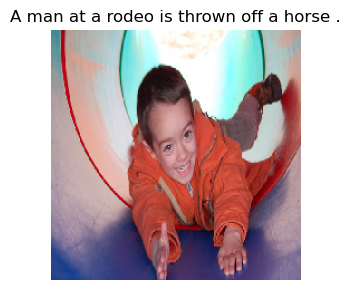

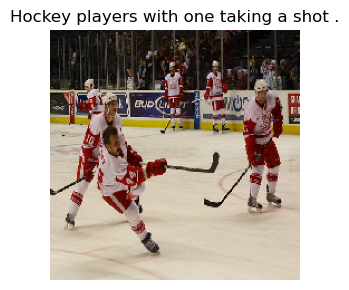

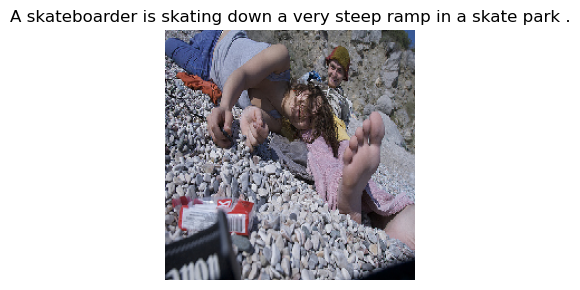

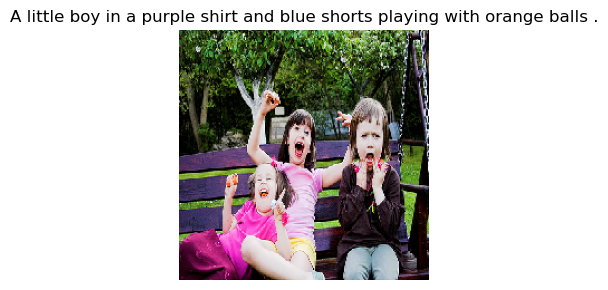

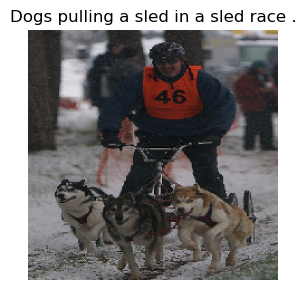

...

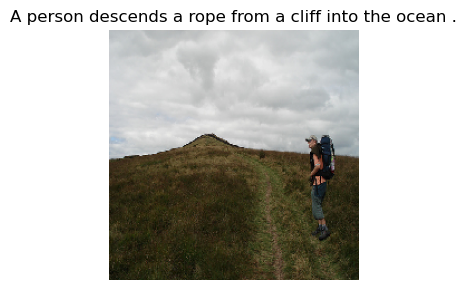

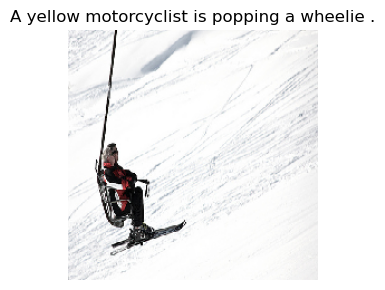

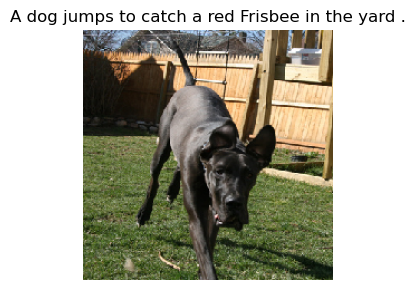

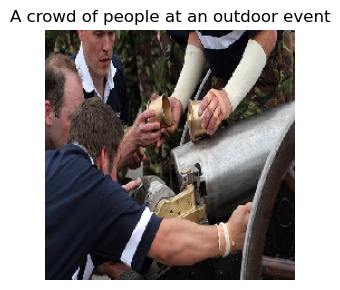

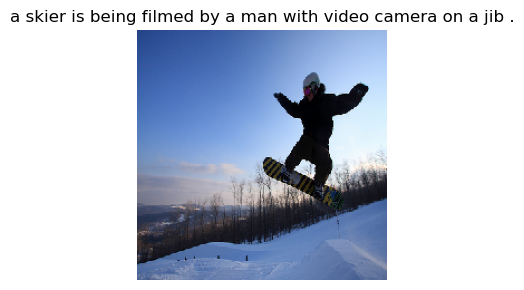

In [30]:
display_img(build_image_loader(train_df, "train_images"))

#### Test

Found 500 validated image filenames.


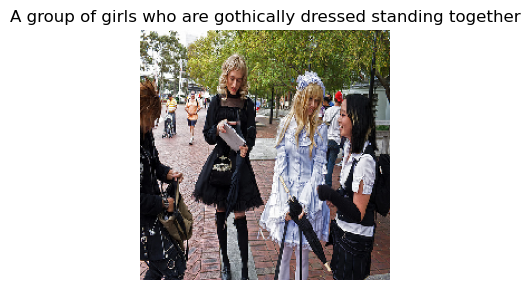

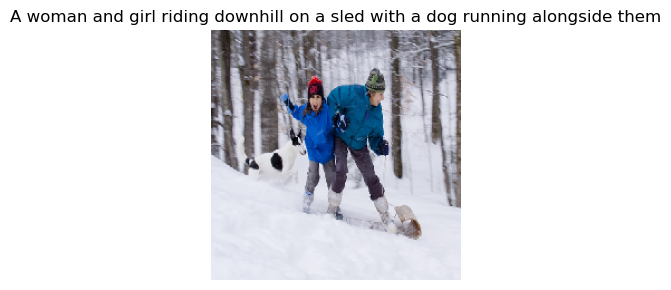

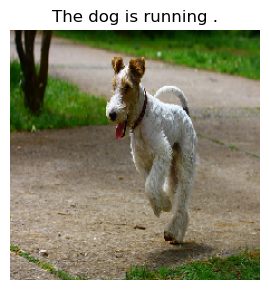

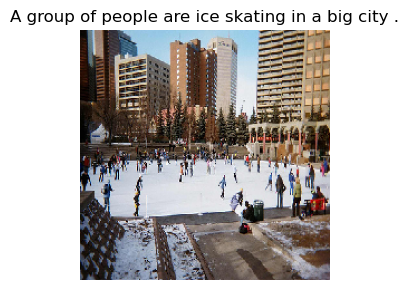

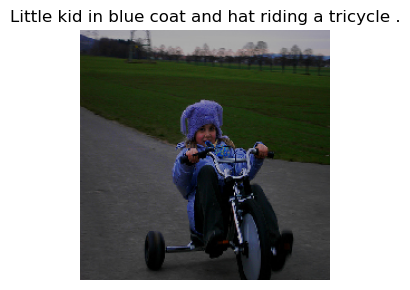

...

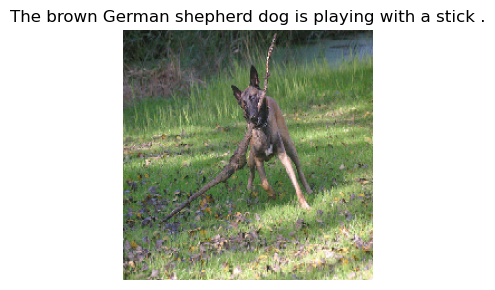

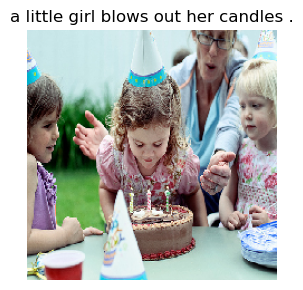

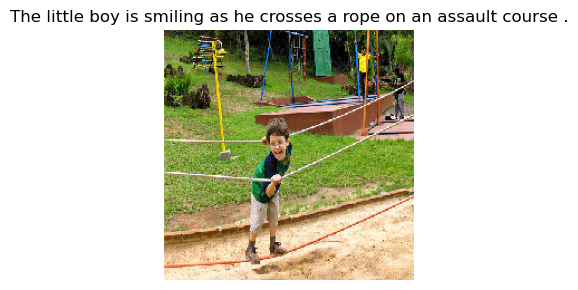

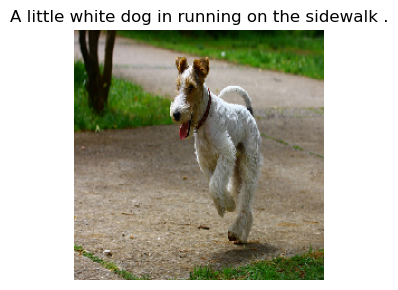

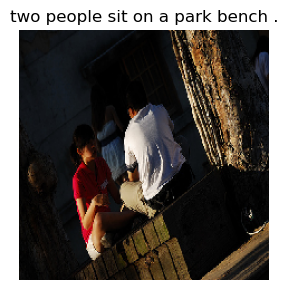

In [32]:
display_img(build_image_loader(test_queries_df, "test_images"))

#### Промежуточный вывод

Видно что не всегда текст соответсвует картинкам. 

### Оценки Экспертов

In [35]:
expert_df.head()

,image,query_id,exp1,exp2,exp3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [36]:
def plot_expert_histograms(df):
    expert_cols = ['exp1', 'exp2', 'exp3']
    
    for col in expert_cols:
        values = df[col].dropna()
        min_val, max_val = int(values.min()), int(values.max())
        
        plt.figure(figsize=(5, 3))
        plt.hist(values, bins=np.arange(min_val, max_val + 2) - 0.5, edgecolor='black')
        plt.title(f'Distribution of {col}')
        plt.xlabel('Label')
        plt.ylabel('Count')
        plt.xticks(range(min_val, max_val + 1))  # Force integer ticks only
        plt.grid(True)
        plt.tight_layout()
        plt.show()

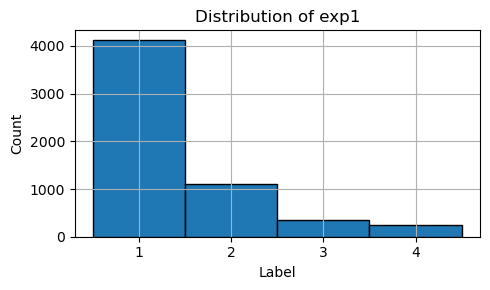

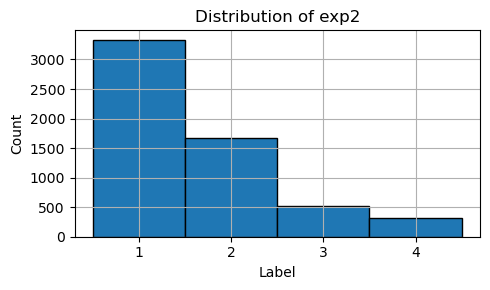

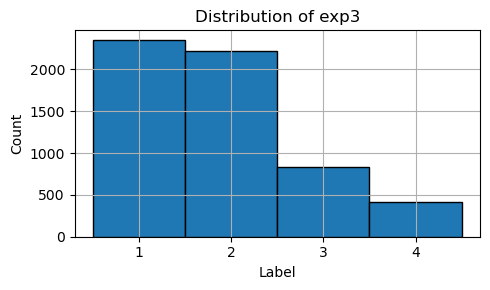

In [37]:
plot_expert_histograms(expert_df)

In [38]:
def print_expert_value_counts(df):
    expert_cols = ['exp1', 'exp2', 'exp3']
    
    for col in expert_cols:
        print(f"\n📊 Value counts for {col}:")
        print(df[col].value_counts().sort_index())

In [39]:
print_expert_value_counts(expert_df)


📊 Value counts for exp1:
exp1
1    4120
2    1109
3     346
4     247
Name: count, dtype: int64

📊 Value counts for exp2:
exp2
1    3327
2    1666
3     518
4     311
Name: count, dtype: int64

📊 Value counts for exp3:
exp3
1    2350
2    2222
3     837
4     413
Name: count, dtype: int64


#### Коррекция оценки экспертов

In [41]:
expert_df['exp_total'] = (expert_df['exp1'] + expert_df['exp2'] + expert_df['exp3'] )/3
expert_df['exp_total']= (expert_df['exp_total'].round()-1)/3

In [42]:
expert_df['exp_total'].head()

0    0.000000
1    0.000000
2    0.000000
3    0.333333
4    0.000000
Name: exp_total, dtype: float64

In [43]:
expert_df['exp_total']= expert_df['exp_total']*0.6

In [44]:
expert_df

,image,query_id,exp1,exp2,exp3,exp_total
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.0
...,...,...,...,...,...,...
5817,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,1,1,1,0.0
5818,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,1,1,1,0.0
5819,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,1,1,2,0.0
5820,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,1,1,1,0.0


In [45]:
expert_df['exp_total'].value_counts()

exp_total
0.0    3315
0.2    1691
0.4     509
0.6     307
Name: count, dtype: int64

#### Промежуточный вывод

Видно что большинство оценок экспертов негативные. 

Так же у нас было 3 эксперта поэтому надо привести к одному числу

Так же у нас были 4 оценки которые по ТЗ дожны  стать одной оценкой весом в 0.6 от целой оценки

Оценки экспертов подведены в правильный формат

### Краудсорсинговые оценки

In [48]:
crowd_df.head(10)

,image,query_id,part_agree,sum_agree,sum_not_agree
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.000000,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.000000,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.333333,1,2
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.000000,0,3
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.000000,0,3


In [49]:
crowd_df['crowd_total'] = crowd_df['part_agree']*0.4

In [50]:
crowd_df.head(10)

,image,query_id,part_agree,sum_agree,sum_not_agree,crowd_total
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0,0.400000
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3,0.000000
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3,0.000000
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3,0.000000
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3,0.000000
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.000000,0,3,0.000000
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.000000,0,3,0.000000
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.333333,1,2,0.133333
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.000000,0,3,0.000000
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.000000,0,3,0.000000


In [51]:
crowd_df['crowd_total'].value_counts()

crowd_total
0.000000    41970
0.133333     3000
0.266667     1360
0.400000     1323
0.100000       96
0.200000       27
0.080000       22
0.300000        9
0.240000        8
0.160000        8
0.320000        4
0.066667        3
Name: count, dtype: int64

### Финальная оценка

#### Crowdsource + Expert

In [54]:
combined_df = expert_df.merge(crowd_df, on=['image', 'query_id'], how='left')

In [55]:
combined_df.head()

,image,query_id,exp1,exp2,exp3,exp_total,part_agree,sum_agree,sum_not_agree,crowd_total
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.0,0.0,0.0,3.0,0.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.0,0.0,0.0,3.0,0.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.0,NaN,NaN,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.2,NaN,NaN,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.0,NaN,NaN,NaN,NaN


In [56]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   image          5822 non-null   object 
 1   query_id       5822 non-null   object 
 2   exp1           5822 non-null   int64  
 3   exp2           5822 non-null   int64  
 4   exp3           5822 non-null   int64  
 5   exp_total      5822 non-null   float64
 6   part_agree     2329 non-null   float64
 7   sum_agree      2329 non-null   float64
 8   sum_not_agree  2329 non-null   float64
 9   crowd_total    2329 non-null   float64
dtypes: float64(5), int64(3), object(2)
memory usage: 455.0+ KB


Отметим что у нас много пропусков в кроудсорсинговых данных

#### Заполнение пропусков

In [59]:
combined_df['crowd_total'] = combined_df['crowd_total'].fillna(
    combined_df['exp_total']
)

In [60]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   image          5822 non-null   object 
 1   query_id       5822 non-null   object 
 2   exp1           5822 non-null   int64  
 3   exp2           5822 non-null   int64  
 4   exp3           5822 non-null   int64  
 5   exp_total      5822 non-null   float64
 6   part_agree     2329 non-null   float64
 7   sum_agree      2329 non-null   float64
 8   sum_not_agree  2329 non-null   float64
 9   crowd_total    5822 non-null   float64
dtypes: float64(5), int64(3), object(2)
memory usage: 455.0+ KB


In [61]:
combined_df['total_score'] = combined_df['crowd_total'] + combined_df['exp_total']

In [62]:
combined_df.head(10)

,image,query_id,exp1,exp2,exp3,exp_total,part_agree,sum_agree,sum_not_agree,crowd_total,total_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.0,0.0,0.0,3.0,0.0,0.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.0,0.0,0.0,3.0,0.0,0.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.0,NaN,NaN,NaN,0.0,0.0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.2,NaN,NaN,NaN,0.2,0.4
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.0,NaN,NaN,NaN,0.0,0.0
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1,0.0,NaN,NaN,NaN,0.0,0.0
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1,0.0,NaN,NaN,NaN,0.0,0.0
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2,0.0,0.0,0.0,3.0,0.0,0.0
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1,0.0,NaN,NaN,NaN,0.0,0.0
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2,0.2,NaN,NaN,NaN,0.2,0.4


In [63]:
combined_df = combined_df.drop(['exp1', 'exp2', 'exp3', 'exp_total', 'part_agree', 'sum_agree', 'sum_not_agree', 'crowd_total'], axis=1)

In [64]:
combined_score_df = combined_df

In [65]:
combined_score_df

,image,query_id,total_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.400000
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000000
...,...,...,...
5817,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,0.000000
5818,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,0.000000
5819,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,0.000000
5820,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,0.000000


#### Промежуточный Вывод

Таргет создан

## Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

### Где же дети?

Посмотрим на данные

In [70]:
train_df.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


Нам повезло что первая строка сразу пример того где есть ребёнок в комментарии

In [72]:
train_df[train_df['query_id'] == '2549968784_39bfbe44f9.jpg#2']

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [73]:
train_df['query_text'] = train_df['query_text'].str.lower()

Стоит обратить внимание на четвертый ряд данных. Query_id = Image. 

### Интересное

In [76]:
train_df['query_id_clean'] = train_df['query_id'].str.extract(r'(^.*?\.jpg)')

In [77]:
test_train_df = train_df[train_df['image'] == train_df['query_id_clean']]

In [78]:
test_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 158 entries, 3 to 5775
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   image           158 non-null    object
 1   query_id        158 non-null    object
 2   query_text      158 non-null    object
 3   query_id_clean  158 non-null    object
dtypes: object(4)
memory usage: 6.2+ KB


Found 158 validated image filenames.


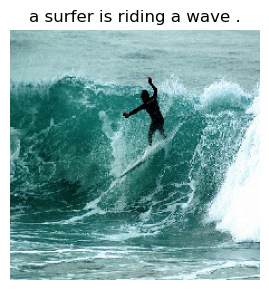

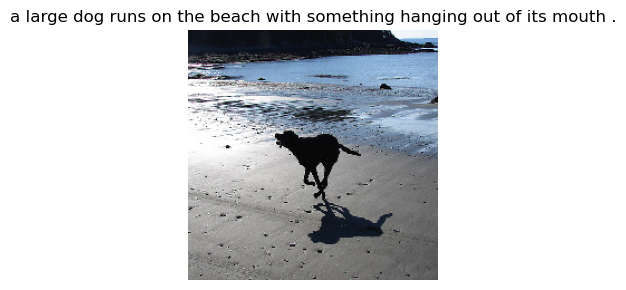

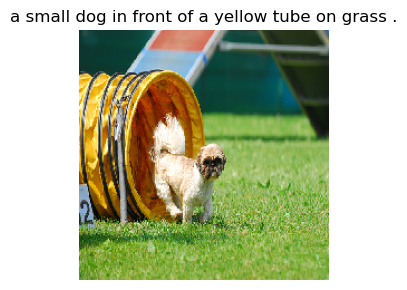

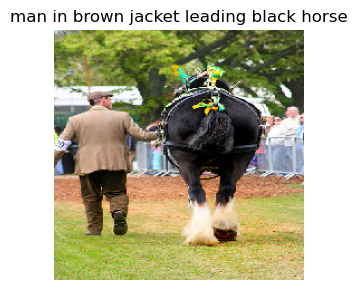

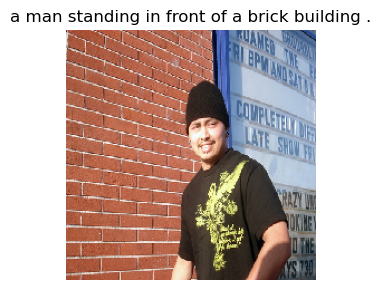

...

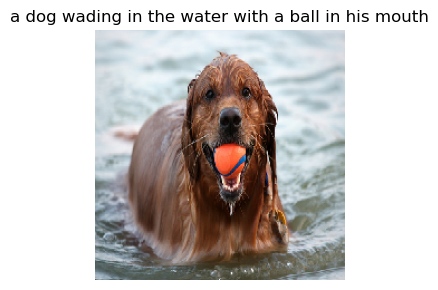

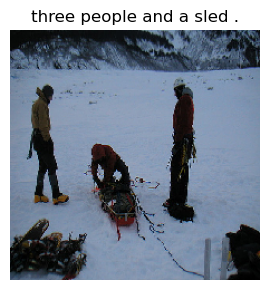

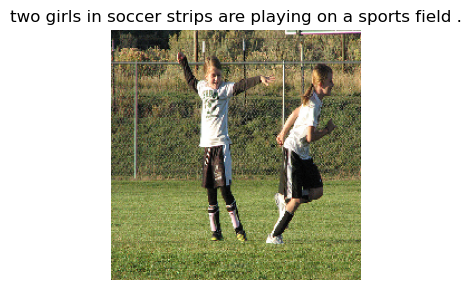

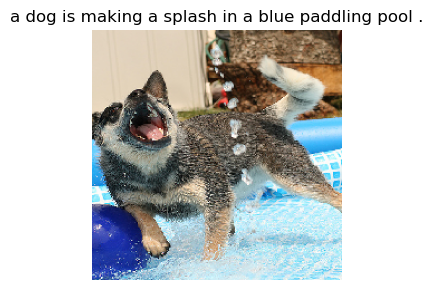

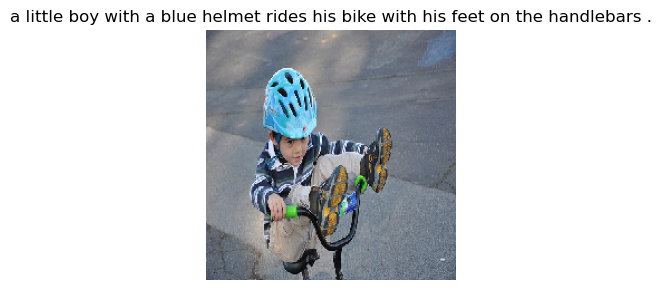

In [79]:
display_img(build_image_loader(test_train_df, "train_images"))

Делаю вывод что у нас в трейне есть оригинальные комментарии только к 158 картинкам. Но зная это мы можем удалить все картинки где оригинальные комментарий содержал в себе слово ребёнок

### Создание списка 'детей'

In [82]:
baby_child_keywords = ['baby', 'babies', 'child', 'children', 'kid', 'kids','infant', 'infants', 'toddler', 'toddlers', 'newborn',
                       'newborns', 'preschooler', 'preschoolers', 'tween', 'tweens', 'teen', 'teens', 'teenager', 'teenagers',
                       'little one', 'youngster', 'youngsters', 'minor', 'minors', 'bubs', 'bub', 'tot', 'tots', 'kiddie',
                       'kiddies', 'nursery', 'playgroup', 'daycare', 'crib', 'pacifier', 'stroller', 'son', 'daughter', 'boy',
                       'girl', 'boys', 'girls']

### Фильтрация train ч1

In [84]:
pattern = r'\b(' + '|'.join([re.escape(word) for word in baby_child_keywords]) + r')\b'

kids_train_df = test_train_df[test_train_df['query_text'].str.contains(pattern, case=False, na=False)]

C:\Users\levle\AppData\Local\Temp\ipykernel_10988\1913237512.py:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  kids_train_df = test_train_df[test_train_df['query_text'].str.contains(pattern, case=False, na=False)]


In [85]:
kids_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38 entries, 3 to 5775
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   image           38 non-null     object
 1   query_id        38 non-null     object
 2   query_text      38 non-null     object
 3   query_id_clean  38 non-null     object
dtypes: object(4)
memory usage: 1.5+ KB


In [86]:
kids_train_df.head()

,image,query_id,query_text,query_id_clean
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg
16,2718495608_d8533e3ac5.jpg,2718495608_d8533e3ac5.jpg#2,a girl wearing a yellow shirt and sunglasses s...,2718495608_d8533e3ac5.jpg
86,2140182410_8e2a06fbda.jpg,2140182410_8e2a06fbda.jpg#2,the kid is on a float in the snow .,2140182410_8e2a06fbda.jpg
220,191003285_edd8d0cf58.jpg,191003285_edd8d0cf58.jpg#2,a man and young girl eat a meal on a city stre...,191003285_edd8d0cf58.jpg
244,3388330419_85d72f7cda.jpg,3388330419_85d72f7cda.jpg#2,two little girls dance on a hardwood floor in ...,3388330419_85d72f7cda.jpg


In [87]:
merged_df = train_df.merge(
    kids_train_df[['image']], 
    on='image',
    how='left',
    indicator=True  
)


train_df_no_kids = merged_df[merged_df['_merge'] == 'left_only'].drop(columns=['_merge'])


In [88]:
train_df_no_kids.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5605 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   image           5605 non-null   object
 1   query_id        5605 non-null   object
 2   query_text      5605 non-null   object
 3   query_id_clean  5605 non-null   object
dtypes: object(4)
memory usage: 218.9+ KB


In [89]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   image           5822 non-null   object
 1   query_id        5822 non-null   object
 2   query_text      5822 non-null   object
 3   query_id_clean  5822 non-null   object
dtypes: object(4)
memory usage: 182.1+ KB


Теперь у нас есть список image где есть дети и его следует убрать из трейна

### Что у нас получилось?

Found 5605 validated image filenames.


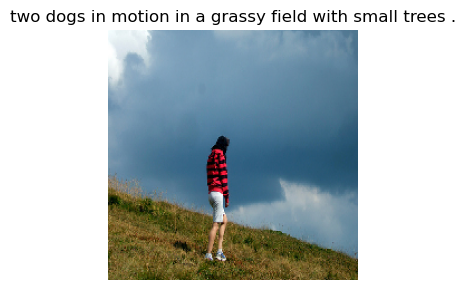

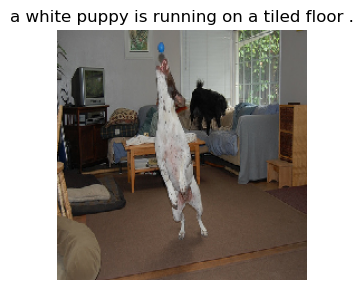

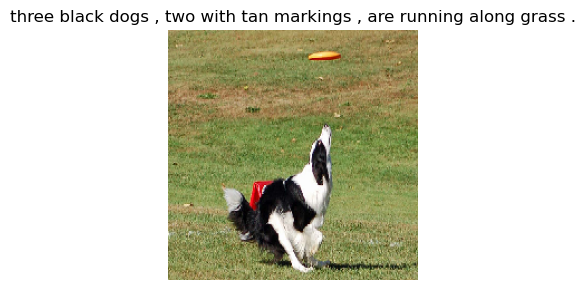

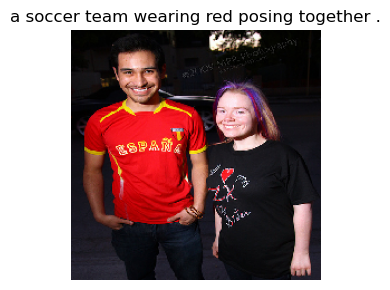

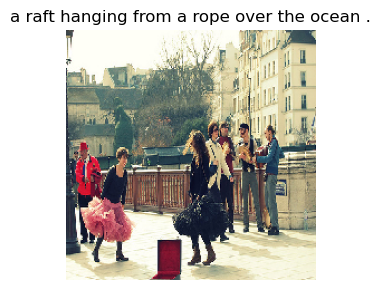

...

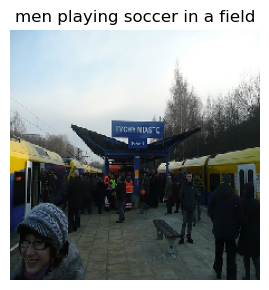

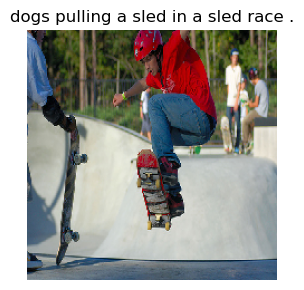

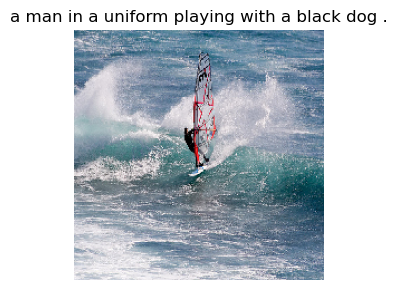

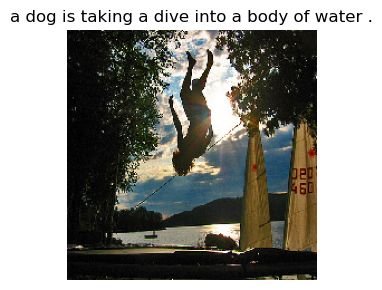

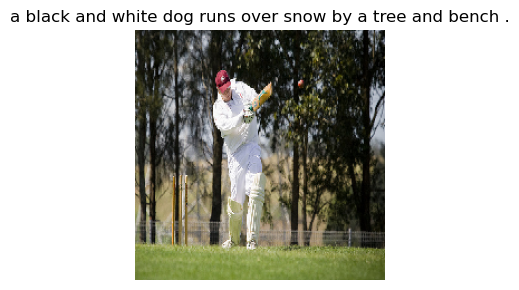

In [92]:
display_img(build_image_loader(train_df_no_kids, "train_images"))

#### Промежуточный вывод

Всё ещё есть дети на фото....

### Фильтрайция train ч2

In [95]:
train_df_no_kids['has_baby_term'] = train_df_no_kids['query_text'].str.contains(pattern, case=False, na=False).astype(int)

C:\Users\levle\AppData\Local\Temp\ipykernel_10988\1911945413.py:1: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  train_df_no_kids['has_baby_term'] = train_df_no_kids['query_text'].str.contains(pattern, case=False, na=False).astype(int)


In [96]:
train_df_no_kids.head(10)

,image,query_id,query_text,query_id_clean,has_baby_term
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1
10,3741827382_71e93298d0.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1


In [97]:
train_df_no_kids = train_df_no_kids.merge(
    combined_score_df,
    on=['image', 'query_id'],
    how='left'
)

In [98]:
high_score_with_baby = train_df_no_kids[
    (train_df_no_kids['total_score'] > 0.6) & 
    (train_df_no_kids['has_baby_term'] == 1)
]

In [99]:
high_score_with_baby.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31 entries, 366 to 5233
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           31 non-null     object 
 1   query_id        31 non-null     object 
 2   query_text      31 non-null     object 
 3   query_id_clean  31 non-null     object 
 4   has_baby_term   31 non-null     int32  
 5   total_score     31 non-null     float64
dtypes: float64(1), int32(1), object(4)
memory usage: 1.6+ KB


Found 31 validated image filenames.


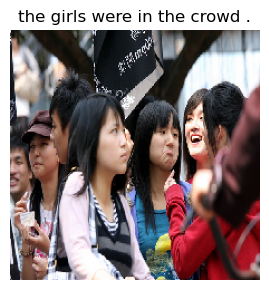

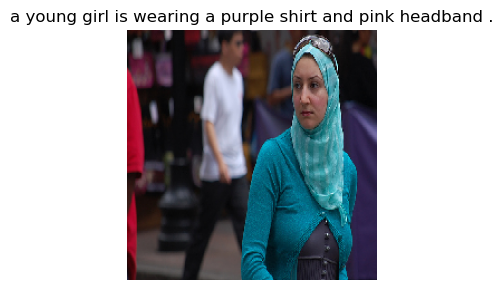

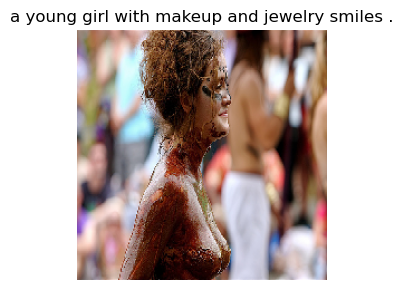

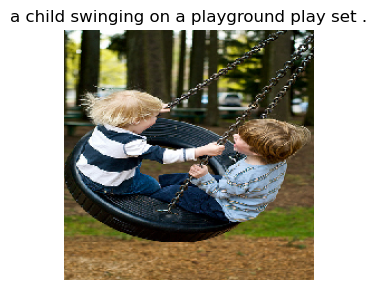

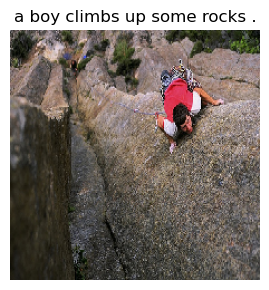

...

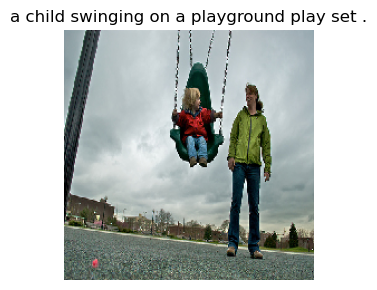

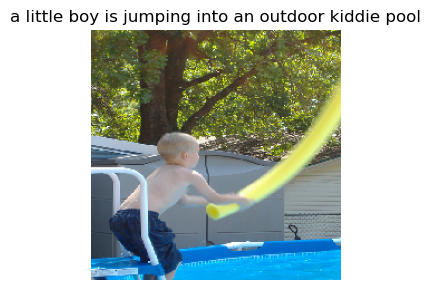

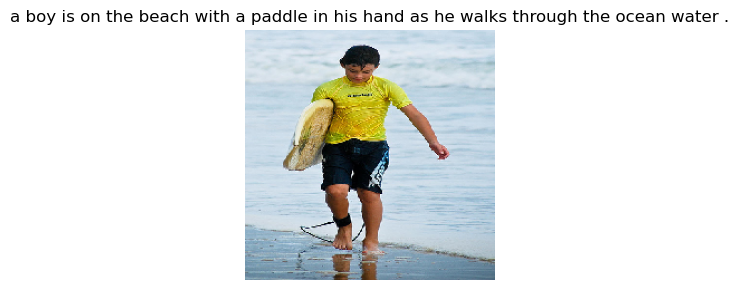

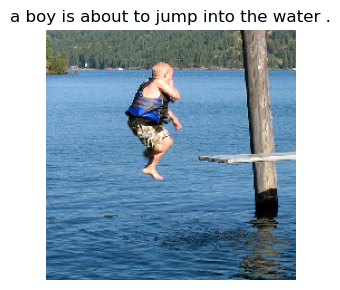

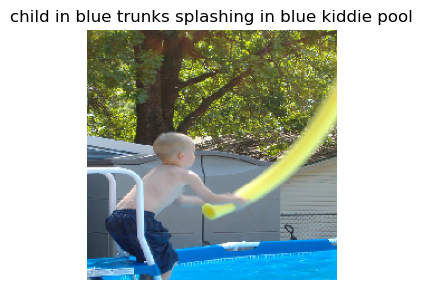

In [100]:
display_img(build_image_loader(high_score_with_baby, "train_images"))

In [101]:
train_df_no_kids = train_df_no_kids.merge(
    high_score_with_baby[['image']],  # just the key column
    on='image',
    how='left',
    indicator=True  
)


train_df_no_kids = train_df_no_kids[train_df_no_kids['_merge'] == 'left_only'].drop(columns=['_merge'])

### Что у нас получилось?

Found 5448 validated image filenames.


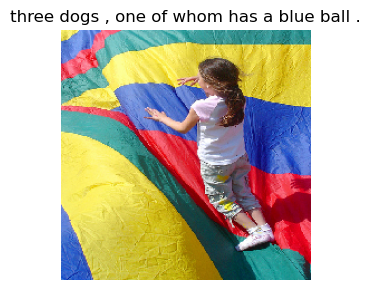

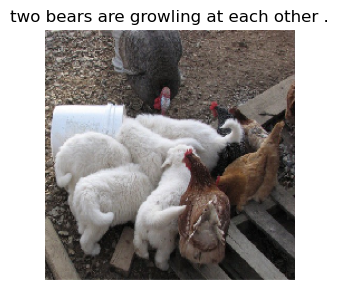

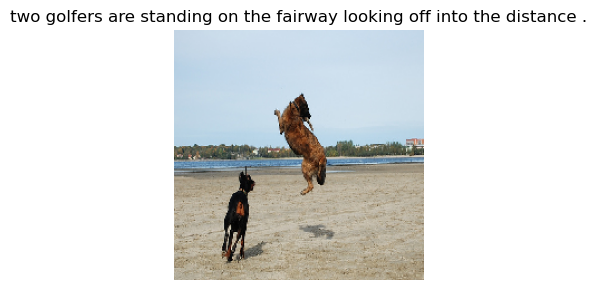

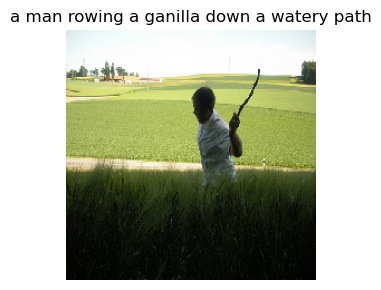

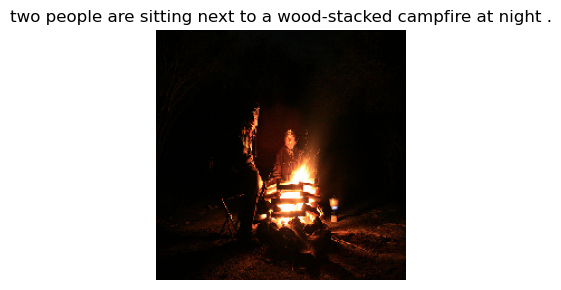

...

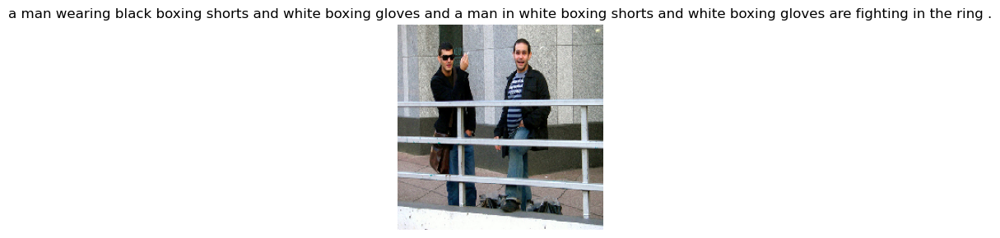

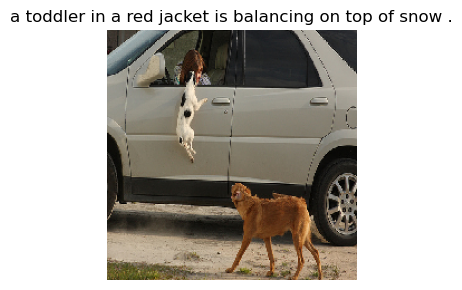

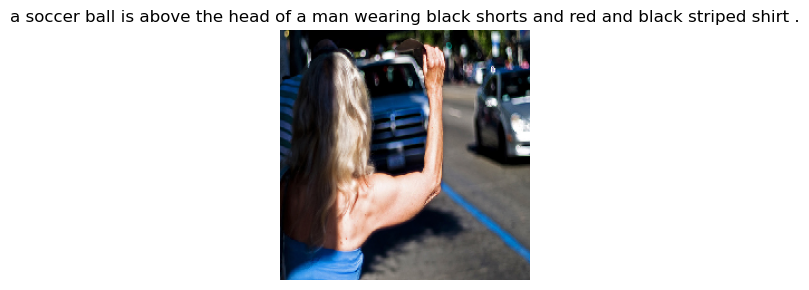

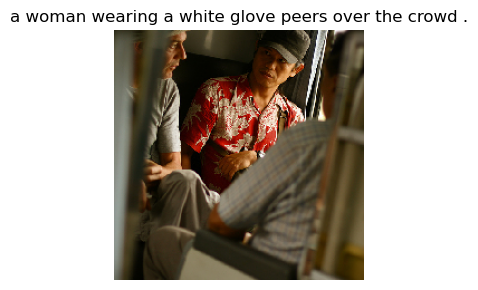

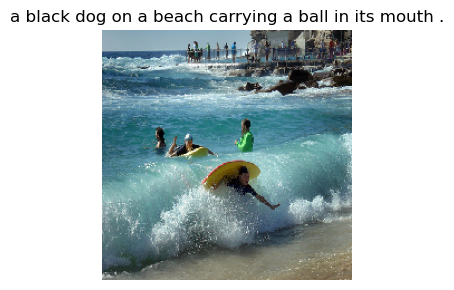

In [103]:
display_img(build_image_loader(train_df_no_kids, "train_images"))

Не очень но мы ограниченны тем какие данные имеем

### Промежуточный Вывод

Были совершенны 2 попытки удаления фотографий детей

- используя взаимосвязь Query_id и Image
- используя наличия слов связанных с детьми и таргетом

К сожалению всех фото с детьми удалить не было возможно

## Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

### Написание и приминение функций

In [108]:
def build_image_flow(df, image_dir):
    datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
    return datagen.flow_from_dataframe(
        dataframe=df,
        directory=image_dir,
        x_col='image',
        y_col=None,
        target_size=(224, 224),
        batch_size=16,
        class_mode=None,
        shuffle=False,
        seed=42
    )

In [109]:
def build_resnet_model(input_shape=(224, 224, 3)):
    model = Sequential()
    model.add(ResNet50(input_shape=input_shape, weights='imagenet', include_top=False))
    model.add(GlobalAveragePooling2D())
    model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='mean_squared_error',
                  metrics=['mae'])
    return model

In [110]:
def extract_image_features(model, dataflow):
    features = []
    for _ in range(len(dataflow)):
        images = next(dataflow)
        predictions = model.predict(images)
        features.append(predictions)
    return np.concatenate(features)

In [111]:
train_df_no_kids.head()

,image,query_id,query_text,query_id_clean,has_baby_term,total_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1,0.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1,0.0
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1,0.2
3,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1,0.0
4,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg,1,0.2


In [112]:
final_data = train_df_no_kids.drop(['query_id_clean', 'has_baby_term'], axis=1)

In [113]:
final_data.head()

,image,query_id,query_text,total_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.0
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.2
3,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.0
4,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.2


In [114]:
image_flow = build_image_flow(final_data, "train_images")

Found 5448 validated image filenames.


In [115]:
image_features = extract_image_features(build_resnet_model(), image_flow)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

In [116]:
image_features.shape

(5448, 2048)

### Вывод

Векторизация завершена

## Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


### Очистка текста без лемматизации/

In [120]:
def preprocess(text):
    text = text.lower()
    text = re.sub(r'[^a-z ]', ' ', text)
    return text

final_data['query_text'] = final_data['query_text'].astype(str).apply(preprocess)

### Лемматизация

In [122]:
def fast_lemmatize(texts):
    return [' '.join([token.lemma_ for token in doc if not token.is_punct and not token.is_space])
            for doc in nlp.pipe(texts, batch_size=1000)]

In [123]:
corpus = final_data['query_text']

In [124]:
print("Исходный текст:", corpus[0])
print("Лемматизированный текст:", fast_lemmatize([corpus[0]])[0])

Исходный текст: a young child is wearing blue goggles and sitting in a float in a pool  
Лемматизированный текст: a young child be wear blue goggle and sit in a float in a pool


In [125]:
final_data['query_text'] = fast_lemmatize(final_data['query_text'])

In [126]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5448 entries, 0 to 5625
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        5448 non-null   object 
 1   query_id     5448 non-null   object 
 2   query_text   5448 non-null   object 
 3   total_score  5448 non-null   float64
dtypes: float64(1), object(3)
memory usage: 341.9+ KB


### tf-idf

In [128]:
nltk_stopwords = stopwords.words("english")

In [129]:
tfidf_vectorizer = TfidfVectorizer(stop_words=nltk_stopwords)
text_features = tfidf_vectorizer.fit_transform(final_data['query_text'])
text_features = text_features.toarray()

In [130]:
print("Размер матрицы:", text_features.shape)

Размер матрицы: (5448, 1182)


### Промежуточный вывод

Текст был очищен, лематизирован и векторизирован

## Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [133]:
features = np.concatenate((image_features, text_features), axis=1)

In [134]:
features.shape

(5448, 3230)

In [135]:
target = final_data['total_score'].values

In [136]:
target.shape

(5448,)

Полученны датасеты с 5448 наблюдениями и 3226 признаками

## Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

### Test train

In [140]:
group_labels = final_data['image']
gss = GroupShuffleSplit(n_splits=1, train_size=0.8, random_state=42)

In [141]:
train_idx, test_idx = next(gss.split(X=features, y=target, groups=group_labels))
X_train, X_valid = features[train_idx], features[test_idx]
y_train, y_valid = target[train_idx], target[test_idx]

### Обучение моделей

#### Catboost

In [144]:
catboost_model = CatBoostRegressor(verbose=0)
catboost_model.fit(X_train, y_train)

In [145]:
y_pred_cb = catboost_model.predict(X_valid)
rmse_cb_value = mean_squared_error(y_valid, y_pred_cb, squared=False)
r2 = r2_score(y_valid,y_pred_cb)
print(f'RMSE CatBoost: {rmse_cb_value:.4f}')
print(f"R²:   {r2:.4f}")

RMSE CatBoost: 0.2308
R²:   0.2443


C:\Users\levle\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


#### Keras

In [147]:
nn_model = Sequential()
nn_model.add(Input(shape=(X_train.shape[1],)))

nn_model = Sequential()
nn_model.add(Input(shape=(X_train.shape[1],)))

nn_model.add(Dense(1024))
nn_model.add(BatchNormalization())
nn_model.add(Dense(1024, activation='relu'))
nn_model.add(Dropout(0.4))

nn_model.add(Dense(512))
nn_model.add(BatchNormalization())
nn_model.add(Dense(512, activation='relu'))
nn_model.add(Dropout(0.3))

nn_model.add(Dense(256, activation='relu'))
nn_model.add(Dropout(0.2))

nn_model.add(Dense(1, activation='linear'))


optimizer = Adam(learning_rate=0.001)
nn_model.compile(loss='mean_squared_error', optimizer=optimizer)


early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)


nn_model.fit(X_train, y_train, epochs=100, batch_size=16,
             validation_data=(X_valid, y_valid),
             callbacks=[early_stopping], verbose=1)

Epoch 1/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.5659 - val_loss: 0.0681
Epoch 2/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0660 - val_loss: 0.0682
Epoch 3/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0639 - val_loss: 0.0682
Epoch 4/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0643 - val_loss: 0.0663
Epoch 5/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0586 - val_loss: 0.0671
Epoch 6/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0631 - val_loss: 0.0675
Epoch 7/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0572 - val_loss: 0.0655
Epoch 8/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0627 - val_loss: 0.0669
Epoch 9/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0564 - val_loss: 0.0662
Epoch 10/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0574 - val_loss: 0.0647
Epoch 11/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0561 - val_loss: 0.0642
Epoch 12/100
274/274 ━━━━━━━━━━━━━━━━━━━━

In [148]:
y_pred_nn = nn_model.predict(X_valid)

rmse_nn_value = mean_squared_error(y_valid, y_pred_nn, squared=False)
r2_nn = r2_score(y_valid,y_pred_nn)
print(f'RMSE Neural Network: {rmse_nn_value}')
print(f"R²:   {r2_nn:.4f}")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
RMSE Neural Network: 0.25216683159619313
R²:   0.0977


C:\Users\levle\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


#### XGBoost

In [ ]:
xgb_model = XGBRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
xgb_model.fit(X_train, y_train)

In [ ]:
y_pred_xgb = xgb_model.predict(X_valid)

In [ ]:
rmse_xgb = np.sqrt(mean_squared_error(y_valid, y_pred_xgb))
r2_xgb = r2_score(y_valid,y_pred_xgb)
print(f"RMSE: {rmse_xgb:.4f}")
print(f"R²:   {r2_xgb:.4f}")

### Вывод

Были обученны 3 модели Catboost, Keras NN, XGBoost
Подсчитаны 2 метрики RMSE, R2

Лучшая модель оказалась Catboost 
RMSE : 0.2308
R²:   0.2443

## Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

### Векторизация image

In [ ]:
test_images_flow = build_image_flow(test_images_df, 'test_images')
test_queries_flow = build_image_flow(test_queries_df, 'test_images')

predictions_test = extract_image_features(build_resnet_model(), test_images_flow)
predictions_test2 = extract_image_features(build_resnet_model(), test_queries_flow)

In [ ]:
predictions_test.shape

### Векторизация текста

In [ ]:
test_queries_df

In [ ]:
test_queries_df['query_text_clean'] = test_queries_df['query_text'].apply(preprocess)

In [ ]:
test_queries_df['query_text_clean'] = fast_lemmatize(test_queries_df['query_text_clean'])

In [ ]:
features_test = tfidf_vectorizer.transform(test_queries_df['query_text_clean'])
features_test = features_test.toarray()

### Final_test_data

In [ ]:
final_features_test = np.concatenate((predictions_test2, features_test), axis=1)

### Catboost

In [ ]:
pred_proba = catboost_model.predict(final_features_test)

### Создание датасета с предсказанием

In [ ]:
test_complete = test_queries_df

In [ ]:
test_complete['prediction'] = pred_proba

In [ ]:
test_complete.head()

### 10 Рандомов

In [ ]:
max_pred_df = test_complete.loc[test_complete.groupby('image')['prediction'].idxmax()]

оставил только максимальное значения предсказания

In [ ]:
max_pred_df.head()

In [ ]:
def display_random_images(generator, n=10):
    imgs, lbls = next(generator)

    # Pick n random indices
    indices = random.sample(range(len(imgs)), min(n, len(imgs)))

    for i in indices:
        plt.figure(figsize=(3, 3))
        plt.imshow(imgs[i])
        plt.title(str(lbls[i]))
        plt.axis('off')
        plt.tight_layout()

In [ ]:
display_random_images(build_image_loader(max_pred_df, "test_images"))

### Вывод

Тестовые данные были обработаны и предсказание дано.

Посмотрев на 10 рандомных картнки видно что модель на удивление не плохо справляется.

### ПСС

In [ ]:
max_pred_df['prediction'].hist(bins=30, figsize=(8, 5))
plt.title("Distribution of Maximum Predictions per Image")
plt.xlabel("Prediction Score")
plt.ylabel("Number of Images")
plt.grid(True)
plt.tight_layout()
plt.show()

Видно что наши предсказания больше склоняются в маловероятные чем в очень вероятные.

## Выводы

- [x]  Jupyter Notebook открыт
- [ ]  Весь код выполняется без ошибок
- [ ]  Ячейки с кодом расположены в порядке исполнения
- [ ]  Исследовательский анализ данных выполнен
- [ ]  Проверены экспертные оценки и краудсорсинговые оценки
- [ ]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [ ]  Изображения векторизованы
- [ ]  Текстовые запросы векторизованы
- [ ]  Данные корректно разбиты на тренировочную и тестовую выборки
- [ ]  Предложена метрика качества работы модели
- [ ]  Предложена модель схожести изображений и текстового запроса
- [ ]  Модель обучена
- [ ]  По итогам обучения модели сделаны выводы
- [ ]  Проведено тестирование работы модели
- [ ]  По итогам тестирования визуально сравнили качество поиска